This notebook creates a summary view of the clustering-based quality of LE embeddings for all data inputs (e.g., real and nullified) across all considered scenarios (e.g., m, knn, dist).

In [1]:
import pandas as pd
import xarray as xr
import numpy as np
import os.path as osp
import hvplot.pandas
import hvplot.xarray
import seaborn as sns
import matplotlib.pyplot as plt
from utils.basics import PNAS2015_subject_list, PRJ_DIR
from utils.basics import le_dist_metrics, le_knns, le_ms
from utils.basics import task_cmap_caps as task_cmap
from scipy.stats import zscore
import panel as pn
import plotly.express as px
from IPython.display import Image
from tqdm.notebook import tqdm
from utils.plotting import plot_2d_scatter, plot_3d_scatter

In [2]:
from sklearn.metrics import silhouette_score
from statannotations.Annotator import Annotator
from scipy.spatial import procrustes

In [3]:
# So far we are working with these values of wls and wss across the whole manuscript
wls = 45
wss = 1.5

### Load Real Data

The following cells create two data structures that we will use throughout the rest of the notebook

* ```si_xrs```: dictionary of xr.DataArray objects. There will be one entry per data type. Each xr.DataArray object contains the SI for all combinations of subjects, distances, knn and m values. 
* ```embs_xrs```:  dictionary of dictionaries. In each entry there is a dictionary containing one dataframe per combination of subjects, distances, knn and m values. The dataframe contains the particular embedding associated with that combination of hyper-parameters

First, we create empty versions of the dictionary structures

In [4]:
si_xrs = {'Original':                 xr.DataArray(dims=['subject','dist','knn','m'],coords={'subject':PNAS2015_subject_list, 'dist':le_dist_metrics,'knn':le_knns,'m':[2,3]}),
          'Connection Randomization': xr.DataArray(dims=['subject','dist','knn','m'],coords={'subject':PNAS2015_subject_list, 'dist':le_dist_metrics,'knn':le_knns,'m':[2,3]}),
          'Phase Randomization':      xr.DataArray(dims=['subject','dist','knn','m'],coords={'subject':PNAS2015_subject_list, 'dist':le_dist_metrics,'knn':le_knns,'m':[2,3]})}

In [5]:
embs_xrs = {'Original':                 {},
          'Connection Randomization': {},
          'Phase Randomization':      {}}

Second, we populate the part corresponding to the original data

In [6]:
%%time
for m in tqdm([2,3], desc='Final Dimensions', position=0, leave=True):
    for dist in tqdm(le_dist_metrics, desc='Distance Metric', leave=False):
        for knn in le_knns:
            for sbj in PNAS2015_subject_list:
                path = osp.join(PRJ_DIR,'Data_Interim','PNAS2015',sbj,'LE','{sbj}_Craddock_0200.WL{wls}s.WS{wss}s.LE_{dist}_k{knn}_m{m}.pkl'.format(sbj=sbj,
                                                                                                                                         wls=str(int(wls)).zfill(3), 
                                                                                                                                         wss=str(wss),
                                                                                                                                         dist=dist,
                                                                                                                                         knn=str(knn).zfill(4),
                                                                                                                                         m=str(m).zfill(4)))
                if not osp.exists(path):
                    print('++ WARNING: Missing file: %s' % path)
                    continue
                df = pd.read_pickle(path)
                df_pure = df.drop('XXXX').copy()
                si_xrs['Original'].loc[sbj,dist,knn,m]=silhouette_score(df_pure, df_pure.index)
                embs_xrs['Original'][(sbj,dist,knn,m)]=df

Final Dimensions:   0%|          | 0/2 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 10min 3s, sys: 36min 49s, total: 46min 53s
Wall time: 5min 52s


Third, we populate the part corresponding to the connection randomized data

In [7]:
%%time
for m in tqdm([2,3], desc='Final Dimensions', position=0, leave=True):
    for dist in tqdm(le_dist_metrics, desc='Distance Metric', leave=False):
        for knn in le_knns:
            for sbj in PNAS2015_subject_list:
                path = osp.join(PRJ_DIR,'Data_Interim','PNAS2015',sbj,'LE','Null_ConnRand','{sbj}_Craddock_0200.WL{wls}s.WS{wss}s.LE_{dist}_k{knn}_m{m}.pkl'.format(sbj=sbj,
                                                                                                                                         wls=str(int(wls)).zfill(3), 
                                                                                                                                         wss=str(wss),
                                                                                                                                         dist=dist,
                                                                                                                                         knn=str(knn).zfill(4),
                                                                                                                                         m=str(m).zfill(4)))
                if not osp.exists(path):
                    print('++ WARNING: Missing file: %s' % path)
                    continue
                df = pd.read_pickle(path)
                df_pure = df.drop('XXXX').copy()
                si_xrs['Connection Randomization'].loc[sbj,dist,knn,m]=silhouette_score(df_pure, df_pure.index)
                embs_xrs['Connection Randomization'][(sbj,dist,knn,m)]=df

Final Dimensions:   0%|          | 0/2 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 11min 34s, sys: 39min 5s, total: 50min 40s
Wall time: 5min 20s


Forth, we populte the part corresponding to the phase randmized data

In [8]:
%%time
for m in tqdm([2,3], desc='Final Dimensions', position=0, leave=True):
    for dist in tqdm(le_dist_metrics, desc='Distance Metric', leave=False):
        for knn in le_knns:
            for sbj in PNAS2015_subject_list:
                path = osp.join(PRJ_DIR,'Data_Interim','PNAS2015',sbj,'LE','Null_PhaseRand','{sbj}_Craddock_0200.WL{wls}s.WS{wss}s.LE_{dist}_k{knn}_m{m}.pkl'.format(sbj=sbj,
                                                                                                                                         wls=str(int(wls)).zfill(3), 
                                                                                                                                         wss=str(wss),
                                                                                                                                         dist=dist,
                                                                                                                                         knn=str(knn).zfill(4),
                                                                                                                                         m=str(m).zfill(4)))
                if not osp.exists(path):
                    print('++ WARNING: Missing file: %s' % path)
                    continue
                df = pd.read_pickle(path)
                df_pure = df.drop('XXXX').copy()
                si_xrs['Phase Randomization'].loc[sbj,dist,knn,m]=silhouette_score(df_pure, df_pure.index)
                embs_xrs['Phase Randomization'][(sbj,dist,knn,m)]=df

Final Dimensions:   0%|          | 0/2 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

Distance Metric:   0%|          | 0/3 [00:00<?, ?it/s]

CPU times: user 12min 57s, sys: 40min 31s, total: 53min 28s
Wall time: 4min 43s


***
# Panel A. SI for all data types, knn, metrics and m=2,3

The next cell takes ```si_xrs``` and seaborn to plot the evolution of SI across knn for the different metric types and also as a function of whether the input is the original data or data that has been nullified.



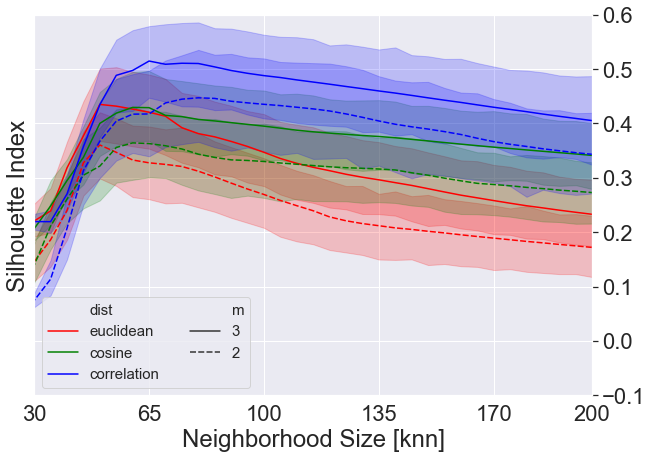

In [46]:
knn_grid = [30,65,100,135,170,200]
aux_df = si_xrs['Original'].to_dataframe(name='SI').reset_index()
sns.set(font_scale=2)
fig,ax = plt.subplots(1,1,figsize=(10,7))
g = sns.lineplot(data=aux_df,x='knn',y='SI', hue='dist', palette=['red','green','blue'], hue_order=['euclidean','cosine','correlation'], style='m', style_order=[3,2], ax=ax)
g.set_xlim(30,200)
g.set_ylim(-.1,.6)
g.set_xlabel('Neighborhood Size [knn]')
g.set_ylabel('Silhouette Index')
g.legend(loc='lower left', ncol=2, fontsize=15)
g.set_xticks(knn_grid)
g.yaxis.tick_right()
g.grid(True)
#aux_df = si_xrs['Connection Randomization'].to_dataframe(name='SI').reset_index()
#sns.lineplot(data=aux_df,x='knn',y='SI', hue='dist', palette=['black','black','black'], hue_order=['euclidean','cosine','correlation'], style='m', style_order=[3,2], ax=ax, legend=None)
#aux_df = si_xrs['Phase Randomization'].to_dataframe(name='SI').reset_index()
#sns.lineplot(data=aux_df,x='knn',y='SI', hue='dist', palette=['grey','grey','grey'], hue_order=['euclidean','cosine','correlation'], style='m', style_order=[3,2], ax=ax, legend=None)

The next two cells show the same information as the one above, but in three separate graphs, one per input data type (original, conn rand, phase rand)

In [13]:
%%time
si_vs_knn_plots = {}
for data_input in ['Original','Connection Randomization','Phase Randomization']:
    aux_df = si_xrs[data_input].to_dataframe(name='SI').reset_index()
    sns.set(font_scale=2)
    fig,ax = plt.subplots(1,1,figsize=(10,7))
    g = sns.lineplot(data=aux_df,x='knn',y='SI', hue='dist', palette=['red','green','blue'], hue_order=['euclidean','cosine','correlation'], style='m', style_order=[3,2], ax=ax)
    g.set_xlim(30,200)
    g.set_ylim(-.1,.6)
    g.set_xlabel('Neighborhood Size [knn]')
    g.set_ylabel('Silhouette Index')
    g.set_xticks(knn_grid)
    g.legend(loc='lower left', ncol=2, fontsize=15)
    si_vs_knn_plots[data_input] = fig
    plt.close()

CPU times: user 35 s, sys: 339 ms, total: 35.3 s
Wall time: 35.2 s


Row
    [0] Matplotlib(Figure)
    [1] Matplotlib(Figure)
    [2] Matplotlib(Figure)
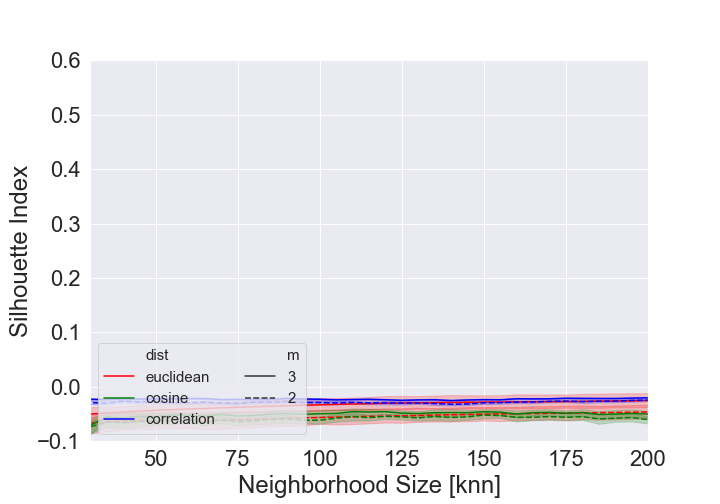
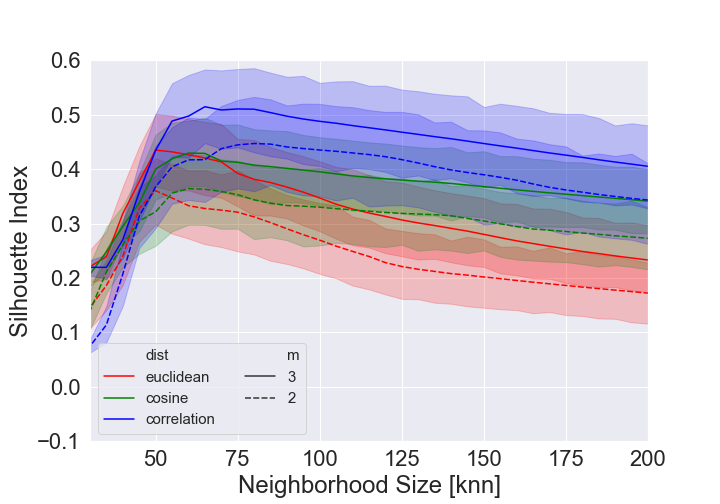
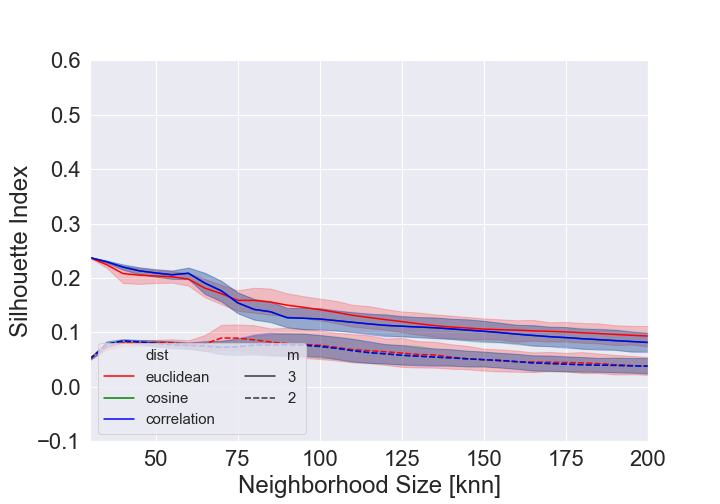

In [14]:
pn.Row(si_vs_knn_plots['Original'], si_vs_knn_plots['Phase Randomization'], si_vs_knn_plots['Connection Randomization'])

***
## Panel A - Representative Embeddings

Panel A also shows 2D embeddings for a few scenarios (combinations of knn and data input). The embeddings are the overlap of the embeddings for all scans after a procrustes transformation

In [15]:
dist='correlation'
m=2
drop_xxxx = True
accessory_plots = {}
knn_grid = [30,65,100,135,170,200]
for data_input in tqdm(['Original','Phase Randomization','Connection Randomization'], desc='Data Input'):
    for knn in knn_grid:
        # Grabs embeddings for the selected scenario
        sel_data           = si_xrs[data_input].loc[:,dist,knn,m].to_dataframe('SI').drop(['dist','knn','m'], axis=1)
        # Identify the best scan in this scenario to use as reference for subsequent procrustes transformations
        best_scan          = sel_data.idxmax()['SI']
        # Get a list with the names of all other scans that need to be transformed
        scans_to_transform = list(sel_data.index)
        scans_to_transform.remove(best_scan)
        # Copy the embedding to use as reference into the ref variable
        ref = embs_xrs[data_input][(best_scan,dist,knn,m)]
        # Create object that will contain all overlapped embeddings
        all_embs           = zscore(ref.copy()).reset_index()
        # Go one-by-one computing transformation and keeping it 
        for scan in scans_to_transform:
            aux            = embs_xrs[data_input][(scan,dist,knn,m)]
            _, aux_trf, m2 = procrustes(ref,aux)
            aux_trf        = pd.DataFrame(zscore(aux_trf),index=aux.index, columns=aux.columns).reset_index()
            all_embs       = all_embs.append(aux_trf).reset_index(drop=True)
        # Drop In-between windows if requested
        if drop_xxxx:
            all_embs = all_embs.set_index('Window Name').drop('XXXX').reset_index()
        # Create the plot
        accessory_plots[(data_input,knn,dist,m)] = all_embs.hvplot.scatter(x='LE001',y='LE002',c='Window Name', cmap=task_cmap, aspect='square', s=2, alpha=.3, legend=False, xaxis=False, yaxis=False, shared_axes=False).opts(tools=[],toolbar=None, show_frame=False)

Data Input:   0%|          | 0/3 [00:00<?, ?it/s]

In [16]:
pn.GridBox(*[accessory_plots[k] for k in accessory_plots.keys()], ncols=len(knn_grid), background='white')

GridBox(background='white', ncols=6)
    [0] HoloViews(Scatter)
    [1] HoloViews(Scatter)
    [2] HoloViews(Scatter)
    [3] HoloViews(Scatter)
    [4] HoloViews(Scatter)
    [5] HoloViews(Scatter)
    [6] HoloViews(Scatter)
    [7] HoloViews(Scatter)
    [8] HoloViews(Scatter)
    [9] HoloViews(Scatter)
    [10] HoloViews(Scatter)
    [11] HoloViews(Scatter)
    [12] HoloViews(Scatter)
    [13] HoloViews(Scatter)
    [14] HoloViews(Scatter)
    [15] HoloViews(Scatter)
    [16] HoloViews(Scatter)
    [17] HoloViews(Scatter)

***
# Panel B - Significant Differences in SI for best case scenario at 3D

First, we find the knn that leads to the best SI for 3d embeddings

In [87]:
si_3d = si_xrs['Original'].loc[:,:,:,3].copy()
knn_max_si = int(si_3d.mean(dim='subject').idxmax(dim='knn').max().values)
print('++ INFO: knn leading to the maximum average SI across all subjects and metrics is: knn=%d' % knn_max_si)

++ INFO: knn leading to the maximum average SI across all subjects and metrics is: knn=65


In [88]:
df_orig = si_xrs['Original'].loc[:,:, knn_max_si,3].to_dataframe(name='SI').reset_index().drop(['knn','m'], axis=1)
df_orig['Input Data'] = 'Original'
df_cr = si_xrs['Connection Randomization'].loc[:,:, knn_max_si,3].to_dataframe(name='SI').reset_index().drop(['knn','m'], axis=1)
df_cr['Input Data'] = 'Conn Rand'
df_pr = si_xrs['Phase Randomization'].loc[:,:, knn_max_si,3].to_dataframe(name='SI').reset_index().drop(['knn','m'], axis=1)
df_pr['Input Data'] = 'Phase Rand'

df2 = pd.concat([df_orig,df_cr,df_pr],axis=0)
df2.infer_objects()


,subject,dist,SI,Input Data
0,SBJ06,euclidean,0.827031,Original
1,SBJ06,correlation,0.843480,Original
2,SBJ06,cosine,0.758382,Original
3,SBJ07,euclidean,0.558217,Original
4,SBJ07,correlation,0.683070,Original
...,...,...,...,...
55,SBJ26,correlation,0.161991,Phase Rand
56,SBJ26,cosine,0.161320,Phase Rand
57,SBJ27,euclidean,0.182680,Phase Rand
58,SBJ27,correlation,0.206308,Phase Rand


Next, we extract the SI values for all scans in that particular scenario

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

euclidean_Original vs. euclidean_Conn Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:1.717e-05 Stat=0.000e+00
cosine_Original vs. cosine_Conn Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:1.717e-05 Stat=0.000e+00
correlation_Original vs. correlation_Conn Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:1.717e-05 Stat=0.000e+00
euclidean_Original vs. euclidean_Phase Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:2.403e-04 Stat=6.000e+00
cosine_Original vs. cosine_Phase Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:8.583e-05 Stat=3.000e+00
correlation_Original vs. correlation_Phase Rand: Wilcoxon test (paired samples) with Bonferroni correction, P_val:3.433e-05 Stat=1.000e+00
cosine_Original 

Text(27.875, 0.5, 'Silhouette Index')

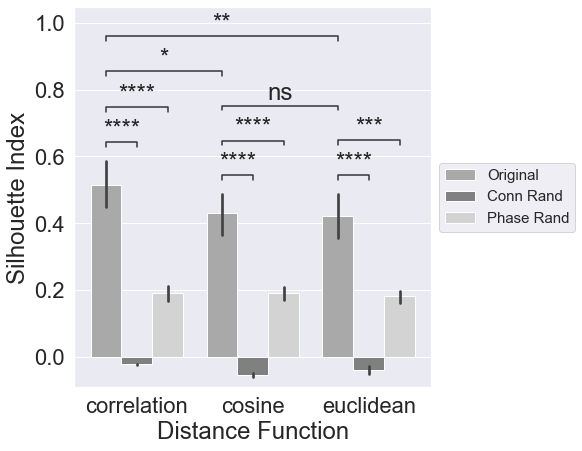

In [89]:
fig, ax = plt.subplots(1,1,figsize=(8,7))
sns.set(font_scale=2)
g = sns.barplot(data=df2, x='dist', y='SI', hue='Input Data', palette=['darkgray','gray','lightgray'], order=['correlation','cosine','euclidean'], ax=ax)
#plt.xticks(rotation = 45)
pairs = [(('euclidean','Original'),('correlation','Original')),(('euclidean','Original'),('cosine','Original')),(('cosine','Original'),('correlation','Original')),
         (('euclidean','Original'),('euclidean','Phase Rand')),(('euclidean','Original'),('euclidean','Conn Rand')),
         (('cosine','Original'),('cosine','Phase Rand')),(('cosine','Original'),('cosine','Conn Rand')),
         (('correlation','Original'),('correlation','Phase Rand')),(('correlation','Original'),('correlation','Conn Rand'))]
annot = Annotator(g, pairs, data=df2, x='dist', y='SI', hue='Input Data', order=['correlation','cosine','euclidean'])
annot.configure(test='Wilcoxon', verbose=2, comparisons_correction='Bonferroni', text_format="star")
annot.apply_test()
annot.annotate()
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),ncol=1, fontsize=15)
ax.set_xlabel('Distance Function')
ax.set_ylabel('Silhouette Index')

Finally, we generate the box plot and annotate it with statistical significance markers

In [47]:
df2 = si_xrs['Original'].loc[:,:, knn_max_si,3].to_dataframe(name='SI').reset_index().drop(['knn','m'], axis=1)
df2.infer_objects()
df2.head(3)

,subject,dist,SI
0,SBJ06,euclidean,0.827031
1,SBJ06,correlation,0.843480
2,SBJ06,cosine,0.758382


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

cosine vs. euclidean: Wilcoxon test (paired samples) with Bonferroni correction, P_val:1.000e+00 Stat=9.400e+01
correlation vs. cosine: Wilcoxon test (paired samples) with Bonferroni correction, P_val:3.628e-03 Stat=2.300e+01
correlation vs. euclidean: Wilcoxon test (paired samples) with Bonferroni correction, P_val:3.050e-03 Stat=2.200e+01


Text(-8.125, 0.5, 'Silhouette Index')

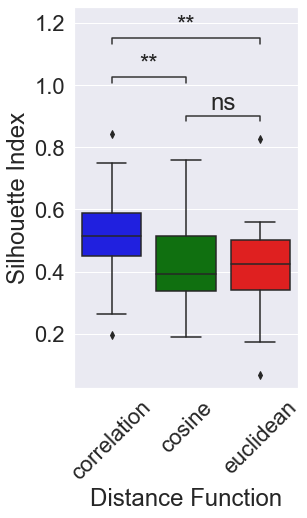

In [48]:
fig, ax = plt.subplots(1,1,figsize=(4,7))
sns.set(font_scale=2)
g = sns.boxplot(data=df2, x='dist', y='SI', palette=['blue','green','red'], order=['correlation','cosine','euclidean'], ax=ax)
plt.xticks(rotation = 45)
pairs = [('euclidean','correlation'),('euclidean','cosine'),('correlation','cosine')]
annot = Annotator(g, pairs, data=df2, x='dist', y='SI', order=['correlation','cosine','euclidean'])
annot.configure(test='Wilcoxon', verbose=2, comparisons_correction='Bonferroni', text_format="star")
annot.apply_test()
annot.annotate()
ax.set_xlabel('Distance Function')
ax.set_ylabel('Silhouette Index')

***
# Panel C - Embedding for all multi-task scans under the best scenario

In [70]:
m_sel = 2
drop_xxxx = True
si_2d                                       = si_xrs['Original'].loc[:,:,:,m_sel].copy()
top_2d                                      = si_2d.mean(dim='subject').to_dataframe('avg SI').sort_values(by='avg SI', ascending=False)
best_dist_2d, best_knn_2d, _, max_avg_si_2d = top_2d.reset_index().iloc[0]
print(top_2d.reset_index().iloc[0])

dist      correlation
knn                80
m                   2
avg SI       0.447268
Name: 0, dtype: object


In [74]:
sel_data           = si_xrs[data_input].loc[:,best_dist_2d,best_knn_2d,m_sel].to_dataframe('SI').drop(['dist','knn','m'], axis=1)
best_scan          = sel_data.idxmax()['SI']
scans_to_transform = list(sel_data.index)
scans_to_transform.remove(best_scan)
print('++ Best scan to use as reference is: %s' % best_scan)
ref = embs_xrs[data_input][(best_scan,best_dist_2d,best_knn_2d,m_sel)]
# Create Final Ouput Object
all_embs           = zscore(ref.copy()).reset_index()

for scan in scans_to_transform:
    aux            = embs_xrs[data_input][(scan,best_dist_2d,best_knn_2d,m_sel)]
    _, aux_trf, m2 = procrustes(ref,aux)
    aux_trf        = pd.DataFrame(zscore(aux_trf),index=aux.index, columns=aux.columns).reset_index()
    all_embs       = all_embs.append(aux_trf).reset_index(drop=True)
    
if drop_xxxx:
    aux = all_embs.set_index('Window Name').drop('XXXX').reset_index()
else:
    aux = all_embs
plot_2d_scatter(aux,x='LE001',y='LE002',c='Window Name')

++ Best scan to use as reference is: SBJ06


:Scatter   [LE001]   (LE002,Window Name)

In [78]:
si_2d.loc[:,best_dist_2d,best_knn_2d].mean().values

array(0.44726754)

***

In [79]:
best_dist_3d = 3
drop_xxxx = True
si_3d                                       = si_xrs['Original'].loc[:,:,:,m_sel].copy()
top_3d                                      = si_3d.mean(dim='subject').to_dataframe('avg SI').sort_values(by='avg SI', ascending=False)
best_dist_3d, best_dist_3d, _, max_avg_si_3d = top_3d.reset_index().iloc[0]
print(top_3d.reset_index().iloc[0])

dist      correlation
knn                65
m                   3
avg SI       0.514894
Name: 0, dtype: object


In [84]:
sel_data           = si_xrs[data_input].loc[:,best_dist_2d,best_knn_2d,m_sel].to_dataframe('SI').drop(['dist','knn','m'], axis=1)
best_scan          = sel_data.idxmax()['SI']
scans_to_transform = list(sel_data.index)
scans_to_transform.remove(best_scan)
print('++ Best scan to use as reference is: %s' % best_scan)
ref = embs_xrs[data_input][(best_scan,best_dist_2d,best_knn_2d,m_sel)]
# Create Final Ouput Object
all_embs           = zscore(ref.copy()).reset_index()

for scan in scans_to_transform:
    aux            = embs_xrs[data_input][(scan,best_dist_2d,best_knn_2d,m_sel)]
    _, aux_trf, m2 = procrustes(ref,aux)
    aux_trf        = pd.DataFrame(zscore(aux_trf),index=aux.index, columns=aux.columns).reset_index()
    all_embs       = all_embs.append(aux_trf).reset_index(drop=True)

if drop_xxxx:
    aux = all_embs.set_index('Window Name').drop('XXXX').reset_index()
else:
    aux = all_embs
plot_3d_scatter(aux,x='LE001',y='LE002',z='LE003',cds=[task_cmap[t] for t in aux['Window Name'].unique()])


pn.extension('plotly')



++ Best scan to use as reference is: SBJ06


Plotly(Figure)

In [85]:
si_3d.loc[:,best_dist_3d,best_knn_3d].mean().values

array(0.514894)

***

# Preliminary Code to generate Supplementary Figure X

In [31]:
# Find case with maximum SI for the phase randomization model
si_xrs['Phase Randomization'].max()

<xarray.DataArray ()>
array(0.27997079)

In [32]:
si_xrs['Phase Randomization'].where(si_xrs['Phase Randomization']> .24).to_dataframe(name='SI').dropna().sort_values(by=['m','SI'], ascending=False)

SI
subject dist        knn m          
SBJ16   euclidean   80  3  0.279971
                    85  3  0.276926
                    90  3  0.265708
SBJ07   cosine      65  3  0.259616
        correlation 65  3  0.259514
        cosine      60  3  0.258056
        correlation 60  3  0.257587
SBJ24   cosine      55  3  0.255291
        correlation 55  3  0.255188
        cosine      60  3  0.253141
        correlation 60  3  0.252962
SBJ21   euclidean   55  3  0.252562
SBJ24   correlation 50  3  0.251771
        cosine      50  3  0.251684
SBJ21   euclidean   50  3  0.251667
SBJ16   euclidean   95  3  0.250866
SBJ24   cosine      45  3  0.247954
        correlation 45  3  0.247921
SBJ21   euclidean   60  3  0.247533
SBJ24   euclidean   50  3  0.246553
SBJ22   euclidean   75  3  0.245982
SBJ21   euclidean   65  3  0.245686
                    45  3  0.245027
SBJ24   euclidean   45  3  0.244599
        cosine      65  3  0.243636
        correlation 65  3  0.243555
        euclidean   40  3  0.243375
                    55  3  0.242837
SBJ22   euclidean   80  3  0.241781
SBJ24   correlation 40  3  0.241569
        cosine      40  3  0.241569
SBJ07   correlation 70  3  0.241095
        cosine      70  3  0.240964
SBJ21   euclidean   40  3  0.240103
SBJ08   euclidean   95  2  0.243452
                    100 2  0.242341
                    105 2  0.241696
                    90  2  0.241467

In [33]:
sbj = 'SBJ08'
dist = 'euclidean'
knn = 65

In [34]:
sbj = 'SBJ09'
dist = 'euclidean'
knn = 90

In [35]:
path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data_Interim/PNAS2015/{sbj}/{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.pkl'.format(sbj=sbj)
swc = pd.read_pickle(path)

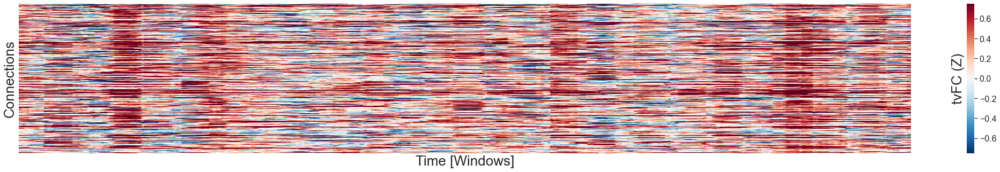

In [36]:
plt.rcParams["figure.autolayout"] = True
fig = plt.figure(figsize=(30,5))
mat = sns.heatmap(swc,cmap='RdBu_r', vmin=-0.75, vmax=0.75, xticklabels=False, yticklabels=False,cbar_kws={'label': 'tvFC (Z)'})
mat.set_xlabel('Time [Windows]', fontsize=26)
mat.set_ylabel('Connections',    fontsize=26)
#for x,l in zip(tick_idxs,tick_labels):
#    mat.add_patch(Rectangle((x-45, -301),  91, 300, fill=True, color=task_cmap_caps[l], lw=0, clip_on=False))
cbar = mat.collections[0].colorbar
# here set the labelsize by 20
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.label.set_size(26)
cbar.ax.yaxis.set_label_position('left')

In [37]:
path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data_Interim/PNAS2015/{sbj}/Null_ConnRand/{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.pkl'.format(sbj=sbj)
swc = pd.read_pickle(path)

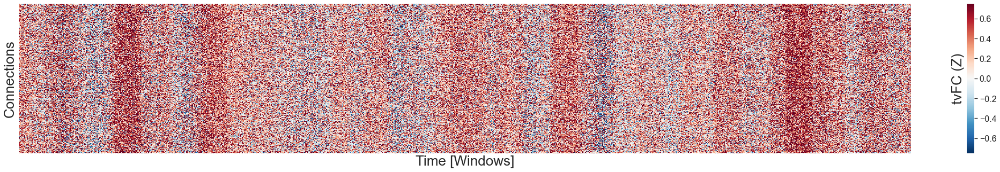

In [38]:
plt.rcParams["figure.autolayout"] = True
fig = plt.figure(figsize=(30,5))
mat = sns.heatmap(swc,cmap='RdBu_r', vmin=-0.75, vmax=0.75, xticklabels=False, yticklabels=False,cbar_kws={'label': 'tvFC (Z)'})
mat.set_xlabel('Time [Windows]', fontsize=26)
mat.set_ylabel('Connections',    fontsize=26)
#for x,l in zip(tick_idxs,tick_labels):
#    mat.add_patch(Rectangle((x-45, -301),  91, 300, fill=True, color=task_cmap_caps[l], lw=0, clip_on=False))
cbar = mat.collections[0].colorbar
# here set the labelsize by 20
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.label.set_size(26)
cbar.ax.yaxis.set_label_position('left')

In [39]:
path = '/data/SFIMJGC_HCP7T/manifold_learning_fmri/Data_Interim/PNAS2015/{sbj}/Null_PhaseRand/{sbj}_Craddock_0200.WL045s.WS1.5s.tvFC.Z.pkl'.format(sbj=sbj)
swc = pd.read_pickle(path)

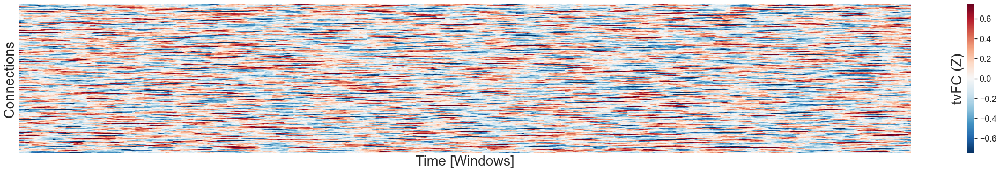

In [40]:
plt.rcParams["figure.autolayout"] = True
fig = plt.figure(figsize=(30,5))
mat = sns.heatmap(swc,cmap='RdBu_r', vmin=-0.75, vmax=0.75, xticklabels=False, yticklabels=False,cbar_kws={'label': 'tvFC (Z)'})
mat.set_xlabel('Time [Windows]', fontsize=26)
mat.set_ylabel('Connections',    fontsize=26)
#for x,l in zip(tick_idxs,tick_labels):
#    mat.add_patch(Rectangle((x-45, -301),  91, 300, fill=True, color=task_cmap_caps[l], lw=0, clip_on=False))
cbar = mat.collections[0].colorbar
# here set the labelsize by 20
cbar.ax.tick_params(labelsize=16)
cbar.ax.yaxis.label.set_size(26)
cbar.ax.yaxis.set_label_position('left')